In [ ]:
!pip install torchmetrics

In [ ]:
import os
import cv2
import numpy as np
from PIL import Image
import albumentations as A
from tqdm import tqdm

import matplotlib.pyplot as plt
%matplotlib inline

import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as transforms
import torch.nn.functional as F

torch.manual_seed(42)
np.random.seed(42)
with open('SIDD_Small_sRGB_Only/Scene_Instances.txt') as f:
# with open('/kaggle/input/smartphone-image-denoising-dataset/SIDD_Small_sRGB_Only/Scene_Instances.txt') as f:
    instances = f.read()

instances = instances.split('\n')
instances[:5]
# path = '/kaggle/input/smartphone-image-denoising-dataset/SIDD_Small_sRGB_Only/Data/'
path = 'SIDD_Small_sRGB_Only/Data/'


noisy_images_path = []
gt_images_path = []

for f in instances:
    p = path + f + '/'
    for g in os.listdir(p):
        image_path = p + g
        
        if 'NOISY' in image_path:
            noisy_images_path.append(image_path)
        else:
            gt_images_path.append(image_path)
            

print('TOTAL NOISY IMAGES:', len(noisy_images_path))
print('TOTAL GROUND TRUTH IMAGES:', len(gt_images_path))
from torch.utils.data import Dataset, DataLoader, Subset

class DenoisingDataset(Dataset):
    
    def __init__(
            self, 
            noisy_images, 
            gt_images, 
            augmentation=None, 
            crop_size=256
    ):
        self.noisy_images = noisy_images
        self.gt_images = gt_images
        self.augmentation = augmentation
        self.crop_size = crop_size

        self.noisy_patches = []
        self.gt_patches = []

        for img_idx in tqdm(range(len(self.noisy_images))):
            image = cv2.cvtColor(cv2.imread(self.noisy_images[img_idx]), cv2.COLOR_BGR2RGB)
            mask = cv2.cvtColor(cv2.imread(self.gt_images[img_idx]), cv2.COLOR_BGR2RGB)
            
            h, w, _ = image.shape
            mid_h, mid_w = h // 2, w // 2
            
            patches_coords = [
                (0, 0, mid_h, mid_w),
                (0, mid_w, mid_h, w),
                (mid_h, 0, h, mid_w),
                (mid_h, mid_w, h, w)
            ]
            
            for y1, x1, y2, x2 in patches_coords:
                noisy_patch = cv2.resize(image[y1:y2, x1:x2], (crop_size, crop_size))
                gt_patch = cv2.resize(mask[y1:y2, x1:x2], (crop_size, crop_size))
                self.noisy_patches.append(noisy_patch)
                self.gt_patches.append(gt_patch)

    def __getitem__(self, idx):
        noisy_image = self.noisy_patches[idx]
        gt_image = self.gt_patches[idx]

        # Convert from HWC to CHW format
        noisy_image = torch.from_numpy(noisy_image).permute(2, 0, 1).float() / 255.0
        gt_image = torch.from_numpy(gt_image).permute(2, 0, 1).float() / 255.0
        
        return noisy_image, gt_image

    def __len__(self):
        return len(self.noisy_patches)

def get_augmentation():
    train_transform = [    
        A.OneOf(
            [
                A.HorizontalFlip(p=1),
                A.VerticalFlip(p=1),
            ],
            p=0.6667
        ),
    ]
    
    return A.Compose(train_transform)

class AugmentedDataset(Dataset):
    def __init__(self, base_dataset, augmentation, augmentations_per_image):
        self.base_dataset = base_dataset
        self.augmentation = augmentation
        self.augmentations_per_image = augmentations_per_image

    def __len__(self):
        return len(self.base_dataset) * self.augmentations_per_image

    def __getitem__(self, idx):
        base_idx = idx // self.augmentations_per_image
        augment_idx = idx % self.augmentations_per_image
        
        noisy_image, gt_image = self.base_dataset[base_idx]
        
        if augment_idx > 0:  # Apply augmentation only on additional copies
            sample = self.augmentation(image=noisy_image.permute(1, 2, 0).numpy(), mask=gt_image.permute(1, 2, 0).numpy())
            noisy_image = torch.from_numpy(sample['image']).permute(2, 0, 1).float()
            gt_image = torch.from_numpy(sample['mask']).permute(2, 0, 1).float()
        
        return noisy_image, gt_image

# Definisikan augmentasi menggunakan fungsi
train_augmentation = get_augmentation()

denoising_dataset = DenoisingDataset(
    noisy_images=noisy_images_path,
    gt_images=gt_images_path,
    crop_size=256
)

# Tentukan ukuran training, validation, dan test set
train_size = int(0.8 * len(denoising_dataset))
valid_size = int(0.1 * len(denoising_dataset))
test_size = len(denoising_dataset) - train_size - valid_size

# Membagi dataset menjadi training, validation, dan test set
train_indices, valid_indices, test_indices = random_split(range(len(denoising_dataset)), [train_size, valid_size, test_size])

# Buat subset dengan augmentasi hanya untuk dataset training
train_dataset = AugmentedDataset(Subset(denoising_dataset, train_indices), train_augmentation, augmentations_per_image=3)
valid_dataset = Subset(denoising_dataset, valid_indices)
test_dataset = Subset(denoising_dataset, test_indices)

# Membuat DataLoader untuk train, validasi, dan test dataset
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=16, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)
FILTER = 128
class LayerNormFunction(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x, weight, bias, eps):
        ctx.eps = eps
        N, C, H, W = x.size()
        mu = x.mean(1, keepdim=True)
        var = (x - mu).pow(2).mean(1, keepdim=True)
        y = (x - mu) / (var + eps).sqrt()
        ctx.save_for_backward(y, var, weight)
        y = weight.view(1, C, 1, 1) * y + bias.view(1, C, 1, 1)
        return y

    @staticmethod
    def backward(ctx, grad_output):
        eps = ctx.eps

        N, C, H, W = grad_output.size()
        y, var, weight = ctx.saved_variables
        g = grad_output * weight.view(1, C, 1, 1)
        mean_g = g.mean(dim=1, keepdim=True)

        mean_gy = (g * y).mean(dim=1, keepdim=True)
        gx = 1. / torch.sqrt(var + eps) * (g - y * mean_gy - mean_g)
        return gx, (grad_output * y).sum(dim=3).sum(dim=2).sum(dim=0), grad_output.sum(dim=3).sum(dim=2).sum(
            dim=0), None

class LayerNorm2d(nn.Module):

    def __init__(self, channels, eps=1e-6):
        super(LayerNorm2d, self).__init__()
        self.register_parameter('weight', nn.Parameter(torch.ones(channels)))
        self.register_parameter('bias', nn.Parameter(torch.zeros(channels)))
        self.eps = eps

    def forward(self, x):
        return LayerNormFunction.apply(x, self.weight, self.bias, self.eps)
def replace_layers(model, base_size, train_size, fast_imp, **kwargs):
    for n, m in model.named_children():
        if len(list(m.children())) > 0:
            ## compound module, go inside it
            replace_layers(m, base_size, train_size, fast_imp, **kwargs)

        if isinstance(m, nn.AdaptiveAvgPool2d):
            pool = AvgPool2d(base_size=base_size, fast_imp=fast_imp, train_size=train_size)
            assert m.output_size == 1
            setattr(model, n, pool)

class Local_Base():
    def convert(self, *args, train_size, **kwargs):
        replace_layers(self, *args, train_size=train_size, **kwargs)
        imgs = torch.rand(train_size)
        with torch.no_grad():
            self.forward(imgs)

class SimpleGate(nn.Module):
    def forward(self, x):
        x1, x2 = x.chunk(2, dim=1)
        return x1 * x2

class NAFBlock(nn.Module):
    def __init__(self, c, DW_Expand=2, FFN_Expand=2, drop_out_rate=0.):
        super().__init__()
        dw_channel = c * DW_Expand
        self.conv1 = nn.Conv2d(in_channels=c, out_channels=dw_channel, kernel_size=1, padding=0, stride=1, groups=1, bias=True)
        self.conv2 = nn.Conv2d(in_channels=dw_channel, out_channels=dw_channel, kernel_size=3, padding=1, stride=1, groups=dw_channel,
                               bias=True)
        self.conv3 = nn.Conv2d(in_channels=dw_channel // 2, out_channels=c, kernel_size=1, padding=0, stride=1, groups=1, bias=True)

        # Simplified Channel Attention
        self.sca = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(in_channels=dw_channel // 2, out_channels=dw_channel // 2, kernel_size=1, padding=0, stride=1,
                      groups=1, bias=True),
        )

        # SimpleGate
        self.sg = SimpleGate()

        ffn_channel = FFN_Expand * c
        self.conv4 = nn.Conv2d(in_channels=c, out_channels=ffn_channel, kernel_size=1, padding=0, stride=1, groups=1, bias=True)
        self.conv5 = nn.Conv2d(in_channels=ffn_channel // 2, out_channels=c, kernel_size=1, padding=0, stride=1, groups=1, bias=True)

        self.norm1 = LayerNorm2d(c)
        self.norm2 = LayerNorm2d(c)

        self.dropout1 = nn.Dropout(drop_out_rate) if drop_out_rate > 0. else nn.Identity()
        self.dropout2 = nn.Dropout(drop_out_rate) if drop_out_rate > 0. else nn.Identity()

        self.beta = nn.Parameter(torch.zeros((1, c, 1, 1)), requires_grad=True)
        self.gamma = nn.Parameter(torch.zeros((1, c, 1, 1)), requires_grad=True)

    def forward(self, inp):
        x = inp

        x = self.norm1(x)

        x = self.conv1(x)
        x = self.conv2(x)
        x = self.sg(x)
        x = x * self.sca(x)
        x = self.conv3(x)

        x = self.dropout1(x)

        y = inp + x * self.beta

        x = self.conv4(self.norm2(y))
        x = self.sg(x)
        x = self.conv5(x)

        x = self.dropout2(x)

        return y + x * self.gamma

class HalfUNet(nn.Module):
    def __init__(self, input_channels=3):
        super(HalfUNet, self).__init__()
        self.initial = nn.Conv2d(3, FILTER, 1, 1)
        self.conv1 = nn.Sequential(
            NAFBlock(FILTER),
            NAFBlock(FILTER)
        )
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Sequential(
            NAFBlock(FILTER),
            NAFBlock(FILTER)
        )
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv3 = nn.Sequential(
            NAFBlock(FILTER),
            NAFBlock(FILTER)
        )

        self.conv_up3 = nn.Conv2d(FILTER, FILTER * 16, 1, bias=False)
        self.up3 = nn.PixelShuffle(4)
        self.conv_up2 = nn.Conv2d(FILTER, FILTER * 4, 1, bias=False)
        self.up2 = nn.PixelShuffle(2)
        self.final_conv = nn.Conv2d(FILTER, 3, kernel_size=1)
        # If you want to perform multi-class segmentation, change the output channels to the desired number

    def forward(self, x):
        x = self.initial(x)
        x1 = self.conv1(x)
        pool1 = self.pool1(x1)
        x2 = self.conv2(pool1)
        pool2 = self.pool2(x2)
        x3 = self.conv3(pool2)

        up3 = self.conv_up3(x3)
        up3 = self.up3(up3)

        up2 = self.conv_up2(x2)
        up2 = self.up2(up2)
        up_scaled = x1 + up2 + up3
        output = self.final_conv(up_scaled)
        return output

# Example usage:
input_tensor = torch.randn(1, 3, 256, 256)  # Example input tensor
model = HalfUNet()
output_tensor = model(input_tensor)
print(output_tensor.shape)  # Print the shape of the output tensor
from torchmetrics.image import StructuralSimilarityIndexMeasure

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

ssim = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

def psnr(img1, img2, data_range=1.0):
    mse = F.mse_loss(img1, img2)
    psnr_val = 20 * torch.log10(data_range / torch.sqrt(mse))
    return psnr_val

def loss_func(x, y):
    return 100 - psnr(x, y)
def evaluate_model(model, dataloader, device=device):
    model.to(device)
    model.eval()
    total_loss = 0.0
    total_psnr = 0.0
    total_ssim = 0.0

    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs, targets = inputs.to(device), targets.to(device)

            outputs = model(inputs)

            loss_val = loss_func(outputs, targets)
            psnr_val = psnr(outputs, targets)
            ssim_val = ssim(outputs, targets)

            total_loss += loss_val.item()
            total_psnr += psnr_val.item()
            total_ssim += ssim_val.item()

    avg_loss = total_loss / len(dataloader)
    avg_psnr = total_psnr / len(dataloader)
    avg_ssim = total_ssim / len(dataloader)

    return avg_loss, avg_psnr, avg_ssim
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

In [105]:
# 1. Initialize the model
# ... (all your class definitions) ...
FILTER = 32
model = HalfUNet()

# 2. Load the saved checkpoint
# checkpoint = torch.load('/kaggle/input/naf_32_double/pytorch/default/1/naf_32_double.pth', map_location=device)
checkpoint = torch.load('naf_32_double.pth', map_location=device)


# --- The Fix ---
# Create a new state_dict with keys that don't have the "module." prefix
new_state_dict = {}
for k, v in checkpoint.items():
    if k.startswith('module.'):
        # Remove the 'module.' prefix from the key
        new_key = k[7:] 
    else:
        new_key = k
    new_state_dict[new_key] = v

# 3. Load the corrected state dictionary into the model
model.load_state_dict(new_state_dict)

# Move the model to the specified device
model.to(device)

# Set the model to evaluation mode
model.eval()

print("Model loaded successfully after removing 'module.' prefix!")

# Example usage:
input_tensor = torch.randn(1, 3, 256, 256).to(device)
with torch.no_grad():
    output_tensor = model(input_tensor)

print(f"Output tensor shape: {output_tensor.shape}")

Model loaded successfully after removing 'module.' prefix!
Output tensor shape: torch.Size([1, 3, 256, 256])


In [106]:
model1 = model

In [107]:
import math
import random
import copy
from typing import List, Dict, Tuple, Callable, Optional

import torch
import torch.nn as nn
import torch.nn.functional as F

# -----------------------------
# 1) Masking + FakeQuant blocks
# -----------------------------

class PruneMask(nn.Module):
    """Applies a binary out-channel mask to a Conv2d's weights at forward time (no shape change)."""
    def __init__(self, conv: nn.Conv2d, mask: Optional[torch.Tensor] = None):
        super().__init__()
        assert isinstance(conv, nn.Conv2d)
        self.conv = conv
        C_out = conv.weight.shape[0]
        if mask is None:
            mask = torch.ones(C_out, dtype=torch.float32)
        self.register_buffer("mask", mask)  # shape [C_out]
    
    def set_mask(self, mask_bool: torch.Tensor):
        # Keep mask as registered buffer (in-place copy)
        mask_t = mask_bool.float().to(self.mask.device)
        self.mask.copy_(mask_t)
    
    def forward(self, x):
        # mask shape [C_out, 1, 1, 1]
        w = self.conv.weight * self.mask.view(-1, 1, 1, 1)
        b = self.conv.bias
        return F.conv2d(
            x, w, b,
            stride=self.conv.stride, padding=self.conv.padding,
            dilation=self.conv.dilation, groups=self.conv.groups
        )

class FakeQuantWeights(nn.Module):
    """
    Symmetric fake-quantization for weights of a Conv2d with bit-width b (1..bmax).
    Applies quantization at forward time (per-layer), keeps original weights for backprop/fine-tune.
    """
    def __init__(self, conv: nn.Conv2d, b_max: int = 8):
        super().__init__()
        self.conv = conv
        self.b_max = b_max
        self.b_current = b_max  # start uncompressed
        # Optional per-layer learned step (we keep simple uniform for first test)
        self.register_buffer("eps", torch.tensor(1e-8))

    def set_bitwidth(self, b: int):
        self.b_current = int(max(1, min(self.b_max, b)))

    @torch.no_grad()
    def _calc_scale(self, w: torch.Tensor, b: int) -> float:
        # Max absolute value per-tensor scale (simple, robust). Avoid 0 by eps.
        max_abs = w.abs().max().item() if w.numel() > 0 else 0.0
        max_abs = max(max_abs, float(self.eps.item()))
        # Handle 1-bit (binary) separately: return scale = max_abs (we'll use sign*scale)
        if b <= 1:
            return max_abs
        qmax = (1 << (b - 1)) - 1  # e.g., 7 for 4-bit
        # qmax should be >= 1 here; guard anyway
        qmax = max(1, qmax)
        return max_abs / float(qmax)

    @torch.no_grad()
    def _fake_quant(self, w: torch.Tensor, b: int) -> torch.Tensor:
        # b >= 32 -> treat as float (no quant)
        if b >= 32:
            return w
        # Compute scale with safe behavior for b <= 1
        scale = self._calc_scale(w, b)
        if scale == 0:
            return torch.zeros_like(w)

        if b <= 1:
            # Binary (1-bit) symmetric quant: q in {-1, +1} scaled by max_abs (scale)
            # torch.sign yields 0 for exact zero entries -> they remain zero
            q = torch.sign(w)
            return q * scale

        # multi-bit symmetric quant case (b >= 2)
        qmax = (1 << (b - 1)) - 1
        # clamp symmetric to [-qmax, qmax]
        q = torch.clamp(torch.round(w / scale), min=-qmax, max=qmax)
        return q * scale


    def forward(self, x):
        wq = self._fake_quant(self.conv.weight, self.b_current)
        b = self.conv.bias
        return F.conv2d(
            x, wq, b,
            stride=self.conv.stride, padding=self.conv.padding,
            dilation=self.conv.dilation, groups=self.conv.groups
        )

def _resolve_conv_module(conv_module, max_depth=20):
    """
    Follow ._orig_conv or .conv links until reaching a real nn.Conv2d.
    Raises TypeError if not found.
    """
    obj = conv_module
    depth = 0
    while depth < max_depth:
        if isinstance(obj, nn.Conv2d):
            return obj
        # Prefer explicit original reference if wrapper stored it
        if hasattr(obj, "_orig_conv") and obj is not getattr(obj, "_orig_conv"):
            obj = getattr(obj, "_orig_conv")
            depth += 1
            continue
        # Otherwise try a generic .conv link (older code)
        if hasattr(obj, "conv") and obj is not getattr(obj, "conv"):
            obj = getattr(obj, "conv")
            depth += 1
            continue
        break
    raise TypeError(f"Could not resolve an underlying nn.Conv2d from object of type {type(conv_module)}")

class MaskedQuantConv(nn.Module):
    """
    Wrapper that stores the original Conv2d as `_orig_conv` and exposes a resolved
    `conv` attribute that is guaranteed to be an `nn.Conv2d`.
    """
    def __init__(self, conv: nn.Module, b_max: int = 8):
        super().__init__()
        # Keep original module for unwrapping or introspection
        self._orig_conv = conv
        # Resolve to an actual nn.Conv2d (follow wrappers if necessary)
        real_conv = _resolve_conv_module(conv)
        if not isinstance(real_conv, nn.Conv2d):
            raise TypeError("MaskedQuantConv expected an nn.Conv2d (resolved), got: %s" % type(real_conv))
        self.conv = real_conv   # this is the actual Conv2d used for weights/bias
        self.masker = PruneMask(self.conv)
        self.quant = FakeQuantWeights(self.conv, b_max=b_max)

    def set_mask(self, mask_bool: torch.Tensor):
        self.masker.set_mask(mask_bool)

    def set_bitwidth(self, b: int):
        self.quant.set_bitwidth(b)

    def forward(self, x):
        # Print the bitwidth being used for this layer
        print(f"[DEBUG] Layer: {self.conv}, Effective Bitwidth: {self.quant.b_current}")
        # Quantize first, then mask (equivalently mask then quantize — both end up zeroing channels)
        w = self.quant._fake_quant(self.conv.weight, self.quant.b_current)
        w = w * self.masker.mask.view(-1, 1, 1, 1)
        b = self.conv.bias
        return F.conv2d(
            x, w, b,
            stride=self.conv.stride, padding=self.conv.padding,
            dilation=self.conv.dilation, groups=self.conv.groups
        )

# -----------------------------------
# 2) Model introspection & attachment
# -----------------------------------

def find_conv2d_modules(model: nn.Module,
                        include_pointwise: bool = True) -> List[Tuple[str, nn.Conv2d]]:
    """
    Returns a list of (qualified_name, Conv2d) for prunable/quantizable layers.
    include_pointwise=False will skip 1x1 convs (optional).
    """
    targets = []
    for name, m in model.named_modules():
        if isinstance(m, nn.Conv2d):
            if not include_pointwise and (m.kernel_size == (1,1)):
                continue
            targets.append((name, m))
    return targets

def attach_wrappers(model: nn.Module,
                    b_max: int = 8,
                    layer_filter: Optional[Callable[[str, nn.Conv2d], bool]] = None
                   ) -> Dict[str, MaskedQuantConv]:
    """
    Replace selected Conv2d modules by MaskedQuantConv wrappers in-place.
    Will safely skip children already wrapped, and will unwrap previous MaskedQuantConv
    if it stores the original conv in _orig_conv.
    Returns map: qualified_name -> wrapper
    """
    # Build parent map
    name_to_parent = {}
    for full_name, module in model.named_modules():
        for cname, child in module.named_children():
            name_to_parent[f"{full_name}.{cname}".lstrip(".")] = (module, cname)

    wrappers = {}
    for name, module in list(model.named_modules()):
        # we'll rely on find_conv2d_modules() for actual targets
        pass

    # Unwrap any existing MaskedQuantConv children that keep the original conv
    for full_name, (parent, child_name) in list(name_to_parent.items()):
        child = getattr(parent, child_name)
        if isinstance(child, MaskedQuantConv) and hasattr(child, "_orig_conv"):
            # replace wrapper with original conv before re-wrapping (prevent nested)
            try:
                setattr(parent, child_name, child._orig_conv)
                # update mapping to reflect original conv now present
                name_to_parent[f"{full_name}.{child_name}".lstrip(".")] = (parent, child_name)
            except Exception:
                # ignore if we cannot unwrap (keep existing)
                pass

    # Now find conv2d modules freshly and wrap them
    for name, conv in find_conv2d_modules(model):
        if layer_filter and not layer_filter(name, conv):
            continue
        # If already wrapped (someone else replaced it with MaskedQuantConv) skip
        if isinstance(conv, MaskedQuantConv):
            continue
        parent, child_name = name_to_parent[name]
        # Double-check child attr is the conv we expect (avoid aliasing surprises)
        child_obj = getattr(parent, child_name)
        if not isinstance(child_obj, nn.Conv2d):
            # If it's not a Conv2d (maybe already replaced), skip
            continue
        wrapper = MaskedQuantConv(child_obj, b_max=b_max)
        setattr(parent, child_name, wrapper)
        wrappers[name] = wrapper
    return wrappers


# -----------------------------
# 3) QUBO coefficients (A,B,D,E,F)
# -----------------------------

@torch.no_grad()
def per_filter_l1_mean(conv_weight: torch.Tensor) -> torch.Tensor:
    """
    For Conv2d weight [C_out, C_in, k, k], return vector length C_out with mean |w| per output filter.
    """
    C_out = conv_weight.shape[0]
    w = conv_weight.detach()
    # Mean abs over [C_in, k, k]
    return w.abs().view(C_out, -1).mean(dim=1)

def build_qubo_coeffs(
    model: nn.Module,
    wrappers: Dict[str, MaskedQuantConv],
    b_max: int = 8
) -> Tuple[List[Tuple[str,int]], List[Tuple[str,int]],
           torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor, torch.Tensor, int, Dict[str, int]]:
    """
    Build QUBO: 
      P vars: one binary for each output filter of each selected Conv2d (prune=1, keep=0).
      Q vars: per-layer bit-removal integer encoded in K bits (K = ceil(log2(b_max))).
    Returns:
      P_index: list of (layer_name, filter_idx)
      Q_index: list of (layer_name, bit_idx)  -- these encode "bits removed"
      A (for Lp), B (for Lq), D,E,F (for R), U_size, layer_out_channels map
    """
    device = next(model.parameters()).device

    # Index sets
    P_index: List[Tuple[str, int]] = []
    Q_index: List[Tuple[str, int]] = []

    layer_out_channels: Dict[str, int] = {}
    K = math.ceil(math.log2(b_max))  # bits to encode removal [0..b_max-1]

    # Collect per-layer stats
    per_layer_filter_means = {}
    per_layer_filter_sizes = {}
    total_model_bits = 0

    for lname, wrap in wrappers.items():
        w = wrap.conv.weight.detach()
        C_out, C_in, kh, kw = w.shape
        layer_out_channels[lname] = C_out
        per_layer_filter_means[lname] = per_filter_l1_mean(w).to(device)   # |w| mean per filter
        per_layer_filter_sizes[lname] = (C_in * kh * kw)                    # N_{n,i} are same within a layer for filters
        # model size contribution if 8-bit baseline:
        total_model_bits += (C_out * C_in * kh * kw) * b_max

        # P-index: one prune bit per output filter
        for i in range(C_out):
            P_index.append((lname, i))
        # Q-index: K bits per layer (shared across all filters of that layer)
        for k in range(K):
            Q_index.append((lname, k))

    # Prepare sizes
    NP = len(P_index)
    NQ = len(Q_index)
    N = NP + NQ

    # Coeff matrices (upper triangular storage not required here; we’ll build full for clarity)
    A = torch.zeros((NP, NP), device=device)     # pruning loss
    B = torch.zeros((NQ, NQ), device=device)     # quantization loss
    D = torch.zeros(NP, device=device)           # compression (self on P)
    E = torch.zeros(NQ, device=device)           # compression (self on Q)
    F = torch.zeros((NP, NQ), device=device)     # compression (interactions P-Q)

    # --- A: Lp = sum_n sum_i sum_j A_{n,i,j} p_{n,i} p_{n,j}
    # A_{n,i,j} = (|w_ni|_mean * |w_nj|_mean) / (N_ni * N_nj)
    # If per_filter_l1_mean returns (||w||1 / N), then outer(means, means) already equals A_block.
    p_offset = 0
    layer_p_offsets = {}
    for lname, wrap in wrappers.items():
        C_out = layer_out_channels[lname]
        means = per_layer_filter_means[lname]        # this is ||w||1 / N
        # Block is outer product of per-filter mean-abs (no extra division)
        block = torch.outer(means, means)             # shape [C_out, C_out]
        A[p_offset:p_offset+C_out, p_offset:p_offset+C_out] = block
        layer_p_offsets[lname] = (p_offset, C_out)
        p_offset += C_out


    # --- B: Lq = sum_n sum_k sum_l B_{n,k,l} q_{n,k} q_{n,l}, with B_{n,k,l} = 2^{k+l}
    # That is per-layer constant block of powers of two.
    q_offset = 0
    layer_q_offsets = {}  # map lname -> (start_idx, K)
    pow2 = torch.tensor([2**k for k in range(K)], device=device, dtype=torch.float32)
    pow2_outer = torch.outer(pow2, pow2)  # [K,K]
    for lname, wrap in wrappers.items():
        B[q_offset:q_offset+K, q_offset:q_offset+K] = pow2_outer
        layer_q_offsets[lname] = (q_offset, K)
        q_offset += K

    # --- Compression term R = sum_n sum_i D_{n,i} p_{n,i} + sum_n sum_k E_{n,k} q_{n,k} - sum_{n,i,k} F_{n,i,k} p_{n,i} q_{n,k}
    # with:
    #   D_{n,i} = N_{n,i} * b_max / S
    #   E_{n,k} = sum_i (2^k * N_{n,i}) / S  = (2^k * C_out * N_{n,i}) / S
    #   F_{n,i,k} = (2^k * N_{n,i}) / S
    S = float(total_model_bits) if total_model_bits > 0 else 1.0

    # Fill D and F per-filter
    p_idx = 0
    for lname, wrap in wrappers.items():
        C_out = layer_out_channels[lname]
        Nin = per_layer_filter_sizes[lname]
        for i in range(C_out):
            D[p_idx] = (Nin * b_max) / S
            # F rows corresponding to p_{n,i} across all K q-bits for this layer:
            q_off, _ = layer_q_offsets[lname]
            for k in range(K):
                F[p_idx, q_off + k] = ( (2**k) * Nin ) / S
            p_idx += 1

    # Fill E per-layer q-bits
    for lname, wrap in wrappers.items():
        C_out = layer_out_channels[lname]
        Nin = per_layer_filter_sizes[lname]
        q_off, _ = layer_q_offsets[lname]
        for k in range(K):
            E[q_off + k] = ( (2**k) * C_out * Nin ) / S

    P_index_list = P_index
    Q_index_list = Q_index
    U_size = N

    return P_index_list, Q_index_list, A, B, D, E, F, U_size, layer_out_channels

# -----------------------------
# 4) Hamiltonian & annealer
# -----------------------------

def build_H_terms(A, B, D, E, F, beta: float, gamma: float):
    """
    Returns a callable H(xP, xQ) that computes:
      H = p^T A p + beta * q^T B q - gamma * ( D^T p + E^T q - p^T F q )
    where p in {0,1}^{NP}, q in {0,1}^{NQ}
    """
    def H(p: torch.Tensor, q: torch.Tensor) -> float:
        # Quadratic terms
        term_p = p @ (A @ p)
        term_q = q @ (B @ q)
        # Compression terms
        comp = D @ p + E @ q - (p @ (F @ q))
        return (term_p + beta * term_q - gamma * comp).item()
    return H

def decode_q_bits_to_b_per_layer(
    Q_index: List[Tuple[str,int]],
    q_bits: torch.Tensor,
    b_max: int
) -> Dict[str, int]:
    """
    q_bits encode "bits removed" r in binary for each layer.
    b = b_max - r. Clamp to [1, b_max].
    If K==0 (no q-bits), return b_max for all layers.
    """
    # Group by layer
    by_layer: Dict[str, List[Tuple[int,int]]] = {}
    for idx, (lname, k) in enumerate(Q_index):
        by_layer.setdefault(lname, []).append((k, idx))
    b_layer = {}
    if len(by_layer) == 0:
        # No quant bits: all layers keep b_max
        # We can't infer layers here from Q_index; caller should pass wrappers if needed.
        # But at least return empty dict, caller code should default to b_max.
        return b_layer

    for lname, pairs in by_layer.items():
        pairs = sorted(pairs, key=lambda x: x[0])
        r = 0
        for k, gidx in pairs:
            bit = int(q_bits[gidx].item())
            r += (bit << k)
        b = max(16, min(b_max, b_max - r))

        # # Enforce minimum bitwidth for specific layers to avoid artifacts
        # if lname == 'conv_up3' or lname == 'conv_up2':
        #     b = max(b, 6) # Ensure at least 6-bit quantization

        b_layer[lname] = b
    return b_layer


In [108]:
!pip install qdeepsdk

In [109]:
import numpy as np
import torch
import time
import requests
import json
import torch
import numpy as np
import math
import time
from tqdm import tqdm
from qdeepsdk import QDeepHybridSolver
from typing import Dict, List, Tuple, Callable, Optional
            
# ---------- Your solver ----------
def run_qdeep_solver(qubo_matrix, m_budget=1000, num_reads=10000):
    token = "ci29wd9u1o"
    solver = QDeepHybridSolver()
    solver.token = token
    solver.m_budget = m_budget
    solver.num_reads = num_reads

    try:
        response = solver.solve(qubo_matrix)
        result = response['QdeepHybridSolver']
        return {'configuration': result['configuration'], 'energy': result['energy'], 'time': result['time']}
    except (ValueError, requests.RequestException) as e:
        return {'error': str(e)}

# -------------------------
# Helper: build_U_full_and_qubo
# -------------------------
def build_U_full_and_qubo(A: torch.Tensor, B: torch.Tensor, D: torch.Tensor, E: torch.Tensor, F: torch.Tensor,
                          beta: float, gamma: float) -> Tuple[torch.Tensor, Dict[Tuple[int,int], float]]:
    """
    Build symmetric U_full (N x N) from components and return (U_full, qubo_dict).
      U_full is arranged as [p (NP), q (NQ)].
    """
    device = A.device  # or choose torch.device("cpu") to keep all on CPU

    # Move everything to the same device
    A = A.to(device)
    B = B.to(device)
    D = D.to(device)
    E = E.to(device)
    F = F.to(device)
    
    NP = int(A.shape[0])
    NQ = int(B.shape[0])
    N = NP + NQ
    U = torch.zeros((N, N), dtype=torch.float32, device=device)

    # Top-left block: pruning quadratic A
    if NP > 0:
        U[:NP, :NP] = A.clone()

    # Bottom-right block: beta * B
    if NQ > 0:
        U[NP:, NP:] = beta * B.clone()

    # Top-right / bottom-left: -gamma * (-0.5 * F mirrored)
    # From H = p^T A p + beta q^T B q - gamma*(D^T p + E^T q - p^T F q)
    # The bilinear p^T F q appears with coefficient (+ gamma) in the final U when we shift signs appropriately.
    # We'll encode the linear terms by subtracting gamma*D and gamma*E from the diagonal,
    # and encode the interaction p_i q_j by (-gamma * -F_ij) -> + gamma * F_ij into off-diagonals.
    if NP > 0 and NQ > 0:
        # Place half on each symmetric side to keep U symmetric
        U[:NP, NP:] = 0.5 * gamma * F.clone()
        U[NP:, :NP] = U[:NP, NP:].T

    # Diagonal linear compression terms: subtract gamma * D and gamma * E
    if NP > 0:
        idx_p = torch.arange(NP)
        U[idx_p, idx_p] = U[idx_p, idx_p] - (gamma * D)
    if NQ > 0:
        idx_q = NP + torch.arange(NQ)
        U[idx_q, idx_q] = U[idx_q, idx_q] - (gamma * E)

    # Convert symmetric U into QUBO dict as Q[(i,i)] and Q[(i,j)] for i<j
    qubo = {}
    U_np = U.cpu().numpy()
    N = U_np.shape[0]
    for i in range(N):
        qubo[(i, i)] = float(U_np[i, i])
    for i in range(N):
        for j in range(i + 1, N):
            # For symmetric U we put Q_{i,j} = U[i,j] + U[j,i] (should be 2*U[i,j])
            qval = float(U_np[i, j] + U_np[j, i])
            qubo[(i, j)] = qval

    return U, qubo

# -------------------------
# Helper: parse qdeep solver response
# -------------------------
def _parse_qdeep_response_solution(qdeep_resp: Dict, N_expected: int) -> Optional[np.ndarray]:
    """
    Robust heuristic parser to extract a single solution vector of length N_expected
    from the response dict returned by run_qdeep_solver().
    """
    if qdeep_resp is None:
        return None
    if "error" in qdeep_resp:
        return None

    cfg = qdeep_resp.get("configuration", qdeep_resp)

    # If configuration is already a list of numbers of length N_expected:
    if isinstance(cfg, list):
        # case: flat list of ints
        if len(cfg) == N_expected and all(isinstance(x, (int, float)) for x in cfg):
            arr = np.array(cfg, dtype=np.int32)
            return _normalize_solution_array(arr)
        # case: list of solution vectors (choose first matching length)
        if len(cfg) > 0 and isinstance(cfg[0], list):
            for cand in cfg:
                if len(cand) == N_expected and all(isinstance(x, (int, float)) for x in cand):
                    return _normalize_solution_array(np.array(cand, dtype=np.int32))
        # case: list of dicts e.g. [{'solution':[...], ...}, ...]
        for item in cfg:
            if isinstance(item, dict):
                for key in ("solution", "sample", "x", "vars", "vector"):
                    if key in item and isinstance(item[key], list) and len(item[key]) == N_expected:
                        return _normalize_solution_array(np.array(item[key], dtype=np.int32))

    # If config is a dict
    if isinstance(cfg, dict):
        # common keys
        for key in ("solution", "sample", "x", "vector", "bits"):
            val = cfg.get(key, None)
            if isinstance(val, list) and len(val) == N_expected:
                return _normalize_solution_array(np.array(val, dtype=np.int32))
        # maybe "solutions" nested
        nested = cfg.get("solutions", None)
        if isinstance(nested, list):
            for item in nested:
                if isinstance(item, list) and len(item) == N_expected:
                    return _normalize_solution_array(np.array(item, dtype=np.int32))
                if isinstance(item, dict):
                    for k in ("solution", "sample", "x"):
                        v = item.get(k, None)
                        if isinstance(v, list) and len(v) == N_expected:
                            return _normalize_solution_array(np.array(v, dtype=np.int32))

    # If nothing matched, try to flatten any numeric arrays found
    def _find_numeric_list(obj):
        if isinstance(obj, list):
            if len(obj) == N_expected and all(isinstance(x, (int, float)) for x in obj):
                return obj
            for sub in obj:
                res = _find_numeric_list(sub)
                if res is not None:
                    return res
        if isinstance(obj, dict):
            for v in obj.values():
                res = _find_numeric_list(v)
                if res is not None:
                    return res
        return None

    found = _find_numeric_list(cfg)
    if found is not None:
        return _normalize_solution_array(np.array(found, dtype=np.int32))

    # Nothing found
    return None

def _normalize_solution_array(arr: np.ndarray) -> np.ndarray:
    """
    Convert solution arrays possibly in {-1,+1} or floats to {0,1} int array.
    """
    arr = arr.flatten()
    # convert floats to near ints
    arr = np.round(arr).astype(np.int32)
    # If values in {-1,1}, convert: -1 -> 1? Wait: typical mapping is {+1 => 1, -1 => 0}
    unique = set(np.unique(arr).tolist())
    if unique <= { -1, 1 }:
        arr = (arr > 0).astype(np.int32)
    # Clip to 0/1
    arr = np.clip(arr, 0, 1).astype(np.int32)
    return arr

# -------------------------
# Helper: one-epoch fine-tune (user training variables used)
# -------------------------
@torch.no_grad()
def evaluate_model_wrapper(model: torch.nn.Module, valid_loader, device) -> Tuple[float, float, float]:
    """
    Wrapper for the user's evaluate_model function name. If you already have evaluate_model(valid_loader)
    then replace or adapt this.
    Returns (val_loss, val_psnr, val_ssim) - uses evaluate_model if available, else falls back to a cheap L2.
    """
    # If user provided evaluate_model previously in scope, use it
    try:
        # user must provide evaluate_model(model, valid_loader, device) in scope; if not, we fallback
        return evaluate_model(model, valid_loader, device)
    except Exception:
        # fallback: simple L2 on first batch
        model.eval()
        for inputs, targets in valid_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            out = model(inputs)
            loss = torch.nn.functional.mse_loss(out, targets).item()
            return loss, 0.0, 0.0
        return 0.0, 0.0, 0.0

def finetune_one_epoch(model: torch.nn.Module, train_loader, optimizer, loss_func, device, max_batches: Optional[int] = None, verbose: bool = True):
    """
    Fine-tune model for one epoch using the same style as your training loop.
    - train_loader: torch.DataLoader
    - optimizer: torch optimizer already configured
    - loss_func: callable(loss)
    - device: torch.device
    - max_batches: optionally limit batches (for quick runs)
    """
    model.train()
    total_loss = 0.0
    total_psnr = 0.0
    total_ssim = 0.0
    n = 0
    loop = tqdm(enumerate(train_loader), total=len(train_loader)) if verbose else enumerate(train_loader)
    for batch_idx, (inputs, targets) in loop:
        if max_batches is not None and n >= max_batches:
            break
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        loss = loss_func(outputs, targets)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # optional metrics, if functions available
        psnr_val = 0.0
        ssim_val = 0.0
        try:
            psnr_val = psnr(outputs, targets).item()
            ssim_val = ssim(outputs, targets).item()
        except Exception:
            pass

        total_loss += loss.item()
        total_psnr += psnr_val
        total_ssim += ssim_val
        n += 1

        if verbose:
            loop.set_description(f'Finetune Step [{batch_idx+1}/{len(train_loader)}]')
            loop.set_postfix(loss=loss.item(), psnr=psnr_val, ssim=ssim_val)

    if n == 0:
        return 0.0, 0.0, 0.0
    return (total_loss / n), (total_psnr / n), (total_ssim / n)

def load_qubo_matrix(filepath):
    """Load QUBO matrix from a file."""
    return np.loadtxt(filepath)

def to_qubo_matrix(U_full: torch.Tensor) -> np.ndarray:
    U_full = U_full.detach().cpu().numpy().astype(np.float64)
    Nmat = U_full.shape[0]
    # zero lower triangle, keep upper
    for i in range(Nmat):
        for j in range(i):
            U_full[i, j] = 0.0
    return U_full

# -------------------------
    # Final: aqc_style_prune_quantize (Qdeep-based)
# -------------------------
def aqc_style_prune_quantize(
    model: torch.nn.Module,
    run_qdeep_solver_fn: Callable[[List[List[float]] , int, int], Dict],  # your run_qdeep_solver signature
    b_max: int = 8,
    beta: float = 1.0,
    gamma: float = 1.5,
    include_pointwise: bool = True,
    skip_layers: Optional[List[str]] = None, # New parameter
    seed: int = 42,
    verbose: bool = True,
    # fine-tune args (optional)
    train_loader = None,
    valid_loader = None,
    optimizer = None,
    loss_func = None,
    device = None,
    finetune_max_batches: Optional[int] = None
) -> Dict[str, object]:
    """
    Full pipeline using the Qdeep solver:
      1) wrap conv layers
      2) build qubo coefficients
      3) build U_full (N x N)
      4) call run_qdeep_solver(U_full.tolist())
      5) parse solution into p*, q*
      6) apply pruning masks and bitwidths to wrappers
      7) optional: fine-tune for 1 epoch (uses provided train_loader/optimizer/loss_func)
    Returns summary dict with applied decisions and solver metadata.
    """
    # Attach wrappers (in-place replacement)
    def _filter_layers(name, conv):
        if skip_layers and any(s_name in name for s_name in skip_layers):
            return False
        if not include_pointwise and (conv.kernel_size == (1,1)):
            return False
        return True

    wrappers = attach_wrappers(model, b_max=b_max, layer_filter=_filter_layers)

    if verbose:
        print(f"[info] Wrapped {len(wrappers)} Conv2d layers.")

    # Build QUBO coefficients
    P_index, Q_index, A, B, D, E, F, U_size, layer_out_channels = build_qubo_coeffs(model, wrappers, b_max=b_max)
    NP, NQ = len(P_index), len(Q_index)
    N = NP + NQ
    if verbose:
        print(f"[info] QUBO sizes — NP (prune vars): {NP}, NQ (quant vars): {NQ}, total: {N}")

    # Build U_full and QUBO dict (we will send matrix U_full to Qdeep)
    U_full, qubo_dict = build_U_full_and_qubo(A, B, D, E, F, beta=beta, gamma=gamma)

    # Save to .problem format (upper triangular as in your example)
    # problem_path = f"qubo_beta{beta:.4f}_gamma{gamma:.4f}.problem"
    # with open(problem_path, "w") as f:
    #     Nmat = U_full.shape[0]
    #     for i in range(Nmat):
    #         row_vals = []
    #         for j in range(Nmat):
    #             if j < i:
    #                 row_vals.append(0.0)  # keep lower triangle zeroed
    #             else:
    #                 row_vals.append(float(U_full[i, j].item()))
    #         f.write(" ".join(f"{val:.6f}" for val in row_vals) + "\n")
    # if verbose:
    #     print(f"[info] Saved QUBO matrix to {problem_path}")

    # Send as NumPy array
    qubo_matrix = to_qubo_matrix(U_full)
    print(qubo_matrix)
    
    if verbose:
        print(f"[info] Sending QUBO matrix to Qdeep solver (shape = {qubo_matrix.shape}) ...")
    
    # Call Qdeep solver
    t0 = time.time()
    qdeep_resp = run_qdeep_solver_fn(qubo_matrix)
    # with open("/kaggle/input/solver-solution1/qdeep_response.json", "r") as f:
        # qdeep_resp = json.load(f)    
    elapsed = time.time() - t0
    if verbose:
        print(f"[info] Qdeep returned in {elapsed:.3f}s")
        print(qdeep_resp)
        
    # after calling the solver:
    with open("qdeep_response.txt", "w") as f:
        json.dump(qdeep_resp, f, indent=4)
    
    # Parse solution directly from your solver's format
    if 'configuration' not in qdeep_resp:
        raise RuntimeError(f"Qdeep solver error: {qdeep_resp}")
    
    sol_arr = np.array(qdeep_resp['configuration'], dtype=np.int8)
    if sol_arr.shape[0] != N:
        raise RuntimeError(f"Unexpected solution length {sol_arr.shape[0]}, expected {N}")

    # Now sol_arr is numpy array of 0/1 bits length N.
    p_bits = sol_arr[:NP].astype(np.int32) if NP > 0 else np.array([], dtype=np.int32)
    q_bits = sol_arr[NP:].astype(np.int32) if NQ > 0 else np.array([], dtype=np.int32)

    # Convert to tensors
    p_star = torch.from_numpy(p_bits).float()
    q_star = torch.from_numpy(q_bits).float()

    # Build masks_by_layer from p_star (paper: p==1 means prune -> mask 0)
    masks_by_layer = {}
    for idx, (lname, fi) in enumerate(P_index):
        masks_by_layer.setdefault(lname, torch.ones(layer_out_channels[lname], dtype=torch.float32))
        masks_by_layer[lname][fi] = 0.0 if int(p_star[idx].item()) == 1 else 1.0

    # Decode q bits into per-layer bitwidths
    bitwidth_by_layer = decode_q_bits_to_b_per_layer(Q_index, q_star, b_max=b_max)

    # Apply to wrappers (preserve device)
    model_device = device if device is not None else next(model.parameters()).device
    for lname, wrapper in wrappers.items():
        mask = masks_by_layer[lname].to(model_device)
        # use in-place copy to keep buffer registered
        try:
            wrapper.set_mask(mask.bool())
        except Exception:
            # fallback if wrapper implementation expects float mask
            wrapper.set_mask(mask)
        wrapper.set_bitwidth(int(bitwidth_by_layer[lname]))

    if verbose:
        total_filters = sum(v.numel() for v in masks_by_layer.values())
        total_pruned = sum(int((m == 0).sum().item()) for m in masks_by_layer.values())
        print(f"[info] Applied pruning masks: {total_pruned}/{total_filters} filters pruned "
              f"({100.0 * total_pruned / max(1, total_filters):.2f}%)")
        print(f"[info] Applied per-layer bit-widths: {bitwidth_by_layer}")

    # Optional fine-tune (one epoch)
    finetune_info = {}
    if train_loader is not None and optimizer is not None and loss_func is not None:
        if verbose:
            print("[info] Starting one-epoch fine-tuning with compressed model...")
        # ensure model and data on same device
        if device is not None:
            model.to(device)
        t_ft0 = time.time()
        avg_loss, avg_psnr, avg_ssim = finetune_one_epoch(model, train_loader, optimizer, loss_func, device or model_device, max_batches=finetune_max_batches, verbose=verbose)
        t_ft = time.time() - t_ft0
        finetune_info = {
            "finetune_loss": avg_loss,
            "finetune_psnr": avg_psnr,
            "finetune_ssim": avg_ssim,
            "finetune_time_s": t_ft
        }
        if verbose:
            print(f"[info] Fine-tune done in {t_ft:.2f}s, loss={avg_loss:.6f}, psnr={avg_psnr:.4f}, ssim={avg_ssim:.4f}")

        # optionally evaluate on validation set
        if valid_loader is not None:
            val_loss, val_psnr, val_ssim = evaluate_model_wrapper(model, valid_loader, device or model_device)
            finetune_info.update({"val_loss": val_loss, "val_psnr": val_psnr, "val_ssim": val_ssim})
            if verbose:
                print(f"[info] Post-finetune validation: loss={val_loss:.6f}, psnr={val_psnr:.4f}, ssim={val_ssim:.4f}")

    # return everything useful
    return {
        "qubo_matrix_sent_shape": (len(qubo_matrix), len(qubo_matrix)),
        "qdeep_response": qdeep_resp,
        "solution_bits": sol_arr.tolist(),
        "p_star": p_bits.tolist(),
        "q_star": q_bits.tolist(),
        "masks": {k: v.tolist() for k, v in masks_by_layer.items()},
        "bitwidths": bitwidth_by_layer,
        
        "finetune_info": finetune_info,
        "wrappers": wrappers
    }

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.025767118..0.9733024].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.12263104..1.0404415].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.100494616..1.0054293].


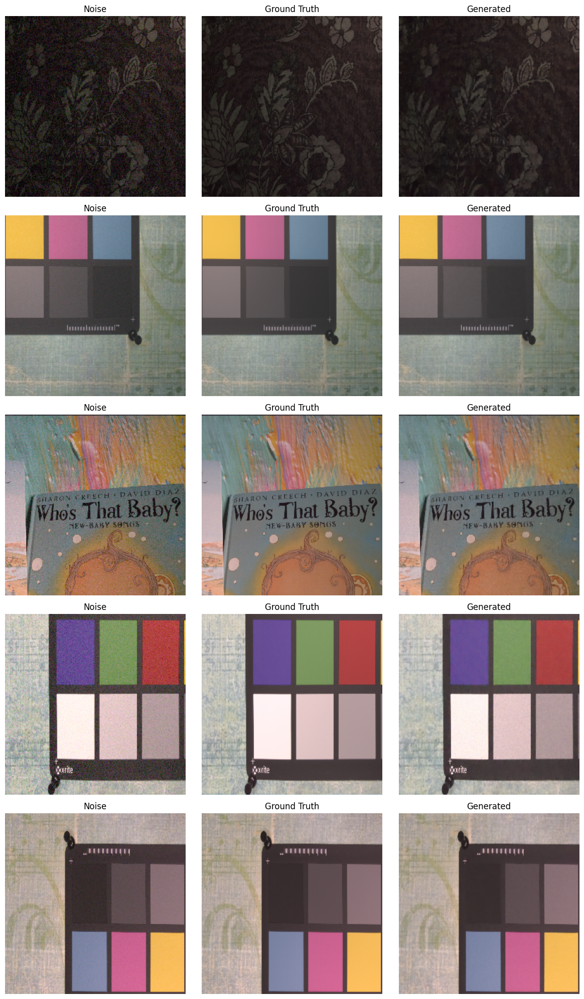

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0005441045..0.7971456].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.09030397..1.0212553].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.010335636..0.6640915].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.005338937..1.0384648].


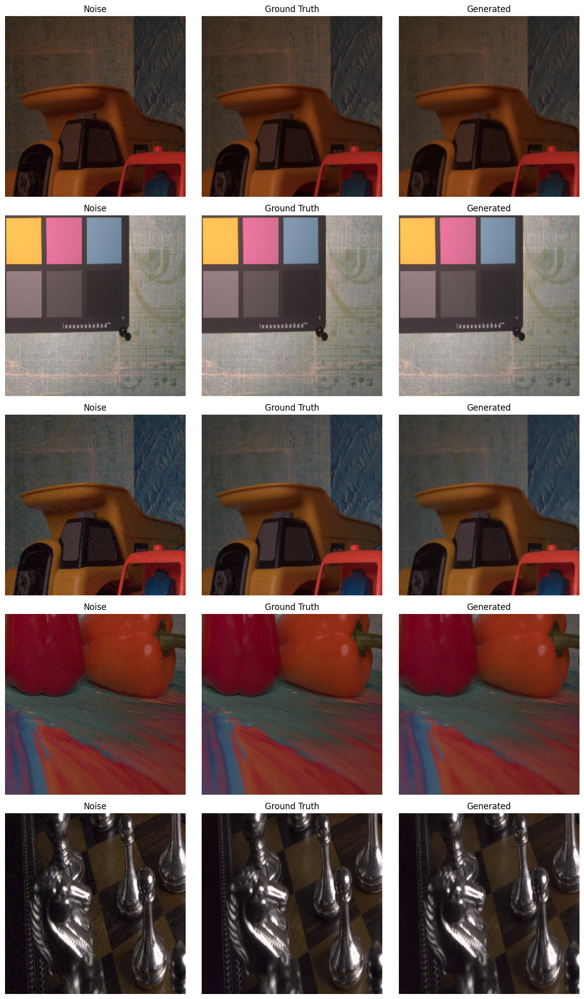

In [110]:
model_vis = model.to('cpu')

# Ensure the model is not wrapped in DataParallel
if isinstance(model_vis, torch.nn.DataParallel):
    model_vis = model_vis.module

model_vis.eval()

# Iterate over a few batches from the test dataset
for batch_idx, (lr, hr) in enumerate(test_loader):
    # Move inputs to CPU
    imgs_lr = lr.cpu()
    imgs_hr = hr.cpu()

    # Forward pass: Generate high-resolution images
    with torch.no_grad():
        gen_hr = model_vis(imgs_lr)

    # Visualize a few sample images
    num_samples = min(5, len(imgs_lr))  # Reduced number of samples for visualization

    fig, axes = plt.subplots(num_samples, 3, figsize=(12, num_samples * 4))
    for i in range(num_samples):
        # Original LR image
        axes[i, 0].imshow(imgs_lr[i].permute(1, 2, 0).numpy())
        axes[i, 0].set_title("Noise")
        axes[i, 0].axis("off")

        # Ground truth HR image
        axes[i, 1].imshow(imgs_hr[i].permute(1, 2, 0).numpy())
        axes[i, 1].set_title("Ground Truth")
        axes[i, 1].axis("off")

        # Generated HR image
        axes[i, 2].imshow(gen_hr[i].permute(1, 2, 0).numpy())
        axes[i, 2].set_title("Generated")
        axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

    # Explicitly delete variables to free memory
    del imgs_lr, imgs_hr, gen_hr

    # Only visualize a few batches
    if batch_idx == 1:
        break

In [111]:
print(evaluate_model_wrapper(model, valid_loader, device))

(64.93807029724121, 35.06192970275879, 0.9067352265119553)


In [112]:
# assume you already have:
# model, device, train_loader, valid_loader, optimizer, loss_func (like in your snippet)

res = aqc_style_prune_quantize(
    model=model,
    run_qdeep_solver_fn=run_qdeep_solver,   # your function
    b_max=32,
    beta=1.0,
    gamma=1000,
    include_pointwise=True,
    skip_layers=["initial", "final_conv"], # Skip initial and final conv layers from pruning
    seed=123,
    verbose=True,
    # train_loader=train_loader,
    # valid_loader=valid_loader,
    # optimizer=optimizer,
    # loss_func=loss_func,
    device=device,
    finetune_max_batches=None  # or a small number during development
)


[info] Wrapped 38 Conv2d layers.
[info] QUBO sizes — NP (prune vars): 2368, NQ (quant vars): 190, total: 2558
[[-4.72360730e-01  3.32612917e-02  1.05979359e-02 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00 -2.82229364e-01  6.23814054e-02 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00 -4.58135068e-01 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 ...
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  8.35181618e+00
   3.20000000e+01  6.40000000e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
   4.87036324e+01  1.28000000e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  0.00000000e+00
   0.00000000e+00  2.25407272e+02]]
[info] Sending QUBO matrix to Qdeep solver (shape = (2558, 2558)) ...
[info] Qdeep returned in 49.862s
{'configuration': [1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 

In [113]:
print(evaluate_model_wrapper(model, valid_loader, device))

[DEBUG] Layer: Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 64, kernel_size=(1, 1), stride

[DEBUG] Layer: Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 64, kernel_size=(1, 1), stride

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07839579..0.4105671].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.048912335..0.8511981].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.015977792..0.95542794].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.007186495..0.9453785].


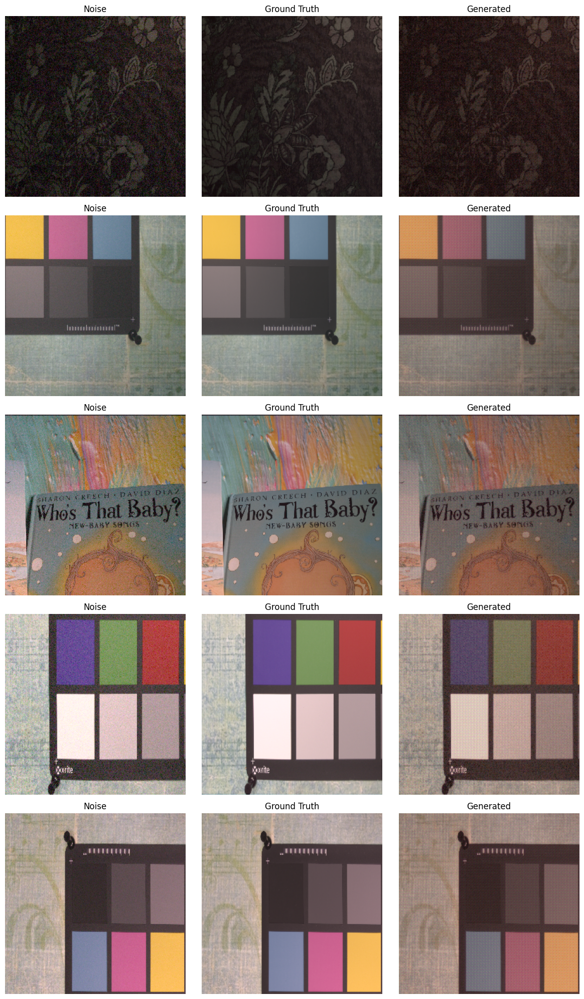

[DEBUG] Layer: Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 64, kernel_size=(1, 1), stride

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08566557..0.70893246].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.012388677..0.9586687].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0918614..0.73478985].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0775763..0.6014209].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07975397..0.95389974].


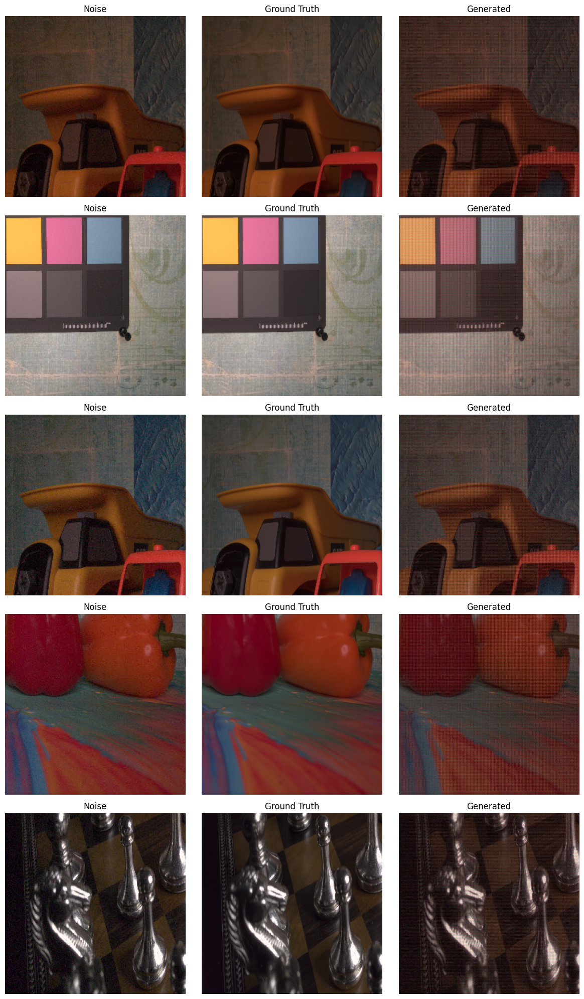

In [114]:
model_vis = model.to('cpu')

# Ensure the model is not wrapped in DataParallel
if isinstance(model_vis, torch.nn.DataParallel):
    model_vis = model_vis.module

model_vis.eval()

# Iterate over a few batches from the test dataset
for batch_idx, (lr, hr) in enumerate(test_loader):
    # Move inputs to CPU
    imgs_lr = lr.cpu()
    imgs_hr = hr.cpu()

    # Forward pass: Generate high-resolution images
    with torch.no_grad():
        gen_hr = model_vis(imgs_lr)

    # Visualize a few sample images
    num_samples = min(5, len(imgs_lr))  # Reduced number of samples for visualization

    fig, axes = plt.subplots(num_samples, 3, figsize=(12, num_samples * 4))
    for i in range(num_samples):
        # Original LR image
        axes[i, 0].imshow(imgs_lr[i].permute(1, 2, 0).numpy())
        axes[i, 0].set_title("Noise")
        axes[i, 0].axis("off")

        # Ground truth HR image
        axes[i, 1].imshow(imgs_hr[i].permute(1, 2, 0).numpy())
        axes[i, 1].set_title("Ground Truth")
        axes[i, 1].axis("off")

        # Generated HR image
        axes[i, 2].imshow(gen_hr[i].permute(1, 2, 0).numpy())
        axes[i, 2].set_title("Generated")
        axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

    # Explicitly delete variables to free memory
    del imgs_lr, imgs_hr, gen_hr

    # Only visualize a few batches
    if batch_idx == 1:
        break

In [115]:
print(evaluate_model_wrapper(model, valid_loader, device))

[DEBUG] Layer: Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1)), Effective Bitwidth: 32
[DEBUG] Layer: Conv2d(32, 64, kernel_size=(1, 1), stride